In [1]:
import sys; sys.path.insert(0, '..')
from database.dataset import *
import pyforest
import matplotlib.pyplot as plt
plt.style.use('default')
import cv2
from math import sqrt
from tqdm import tqdm
from scipy.ndimage import gaussian_filter
from skimage.feature import blob_dog, hessian_matrix,hessian_matrix_eigvals

In [2]:
db = INBreast_Dataset(
        return_lesions_mask=True,
        level='image',
        extract_patches=False,
        normalize=None,
        n_jobs=-1,
)


In [101]:
img_idx = 0

#### Functions

In [93]:
def plot_bboxes_over_image(image, bboxes, colors, types, thickness=2, alpha=0.8):
    """Overimposes bboxes on the image. Can work with multiple groups of bboxes
    Args:
        image (np.ndarray): Grayscale image for overimposition
        bboxes (List[np.ndarray]): List of bboxes arrays.
            Should be one of the specific shape depending of bbox type:
                (n_bboxes, top_left_coord, top_right_coordinate) - rect type
                    top_left_coord, top_right_coordinate - tuples with 2 integer coords
                (n_bboxes, centre_x, centre_y, radius) - circ type
                    center coordinates and radiuses should be integers
        colors (list): List of colors to be assigned to the bboxes. BGR convention
        types (list): List of types: 'rect' OR 'circ'
    """
    img_uint8 = (255*(image/image.max())).astype(np.uint8)
    img_bgr = cv2.cvtColor(img_uint8, cv2.COLOR_GRAY2RGB)

    for bbox_group_idx, bbox_group in enumerate(bboxes):
        bbox_mask = np.zeros(
            (image.shape[0], image.shape[1], 3)).astype(np.uint8)
        for bbox in bbox_group:
            if types[bbox_group_idx] == 'rect':
                bbox_mask = cv2.rectangle(bbox_mask, bbox[0], bbox[1],
                                          color=colors[bbox_group_idx],
                                          thickness=thickness)
            elif types[bbox_group_idx] == 'circ':
                bbox_mask = cv2.circle(bbox_mask, (bbox[0], bbox[1]),
                                       bbox[2], color=colors[bbox_group_idx],
                                       thickness=thickness)
        beta = 1 - alpha
        img_bgr = cv2.addWeighted(img_bgr, alpha, bbox_mask, beta, 0.0)
    return img_bgr

In [64]:
def plot_img_rois(index: int, colors = ['yellow','orange'], linewidth = 1,radius = 6):
    """
    Plots the original image with rois as markers. Rectangles for rois with bounding boxes
    and circles with given radius for point lesions. Both markers with given linewidth and colors.

    Args:
        index (int): index of item in the database instance INBreast_Dataset
        colors (list, optional): color of the marker [rectangles, circles]. Defaults to ['yellow','orange'].
        linewidth (int, optional): width of line. Defaults to 1.
        radius (int, optional): radius of circles. Defaults to 6.
    """
    f,ax = plt.subplots(1,2,figsize=(10,8))
    ax[0].imshow(db[index]['img'],cmap='gray') # display image
    
    #bbox[1][0]-bbox[0][0],bbox[1][1]-bbox[0][1]] \
    lesion_bbxs = [[bbox[0],bbox[1][0]-bbox[0][0],bbox[1][1]-bbox[0][1]] \
         for bbox in db[index]['lesion_bboxes'] if bbox[0] != bbox[1]] # get lesion boxes

    lesion_pts = [bbox[0] for bbox in db[index]['lesion_bboxes'] if bbox[0] == bbox[1]] # get lesion points
    
    for coords,width,height in lesion_bbxs:
        rec = plt.Rectangle(coords, width=width, height=height, color=colors[0], linewidth=linewidth, fill=False)
        ax[0].add_patch(rec)
    for coords in lesion_pts:
        c = plt.Circle(coords, radius=radius, color=colors[1], linewidth=linewidth, fill=False)
        ax[0].add_patch(c)
    ax[0].set_title('Image with ROIs')
    ax[0].axis('off')
    ax[1].imshow(db[index]['lesion_mask'])
    ax[1].set_title('Image mask')
    ax[1].axis('off')
    plt.tight_layout()
    plt.show()

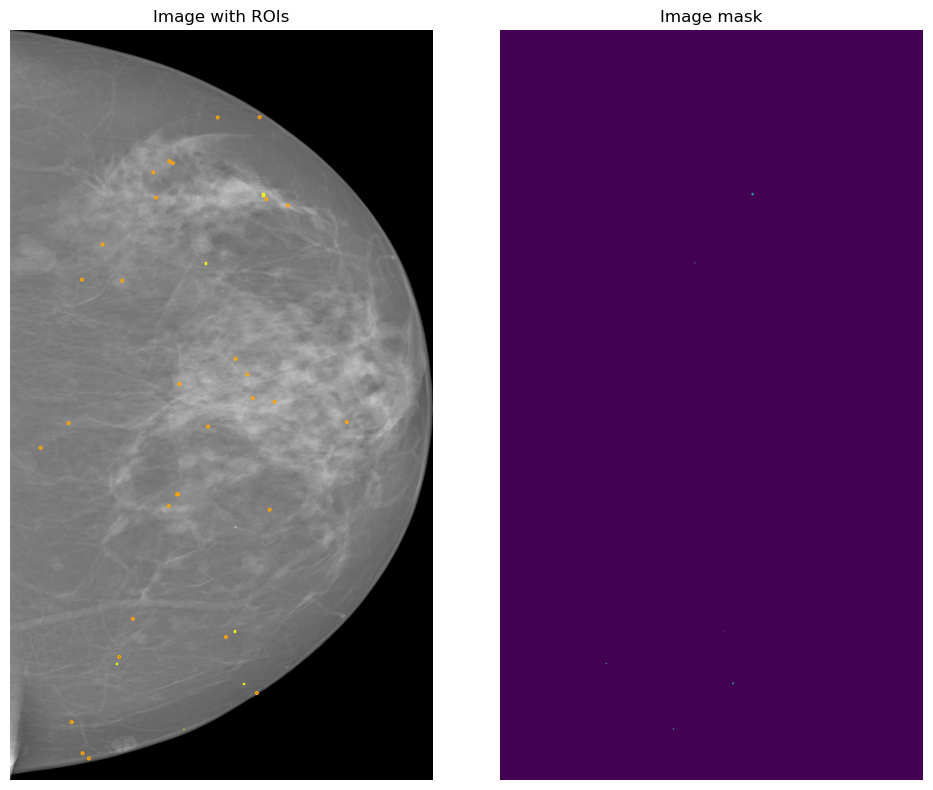

In [99]:
plot_img_rois(0)

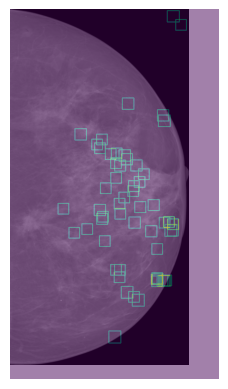

In [100]:
roi_mask = np.zeros(db[0]['img'].shape)
for i in db[1]['lesion_bboxes']:
    roi_mask = cv2.rectangle(roi_mask, (i[0][0]-50, i[0][1]-50), (i[1][0]+50, i[1][1]+50), 255, 3)
plt.figure()
plt.imshow(db[1]['img'], cmap='gray' )
plt.imshow(roi_mask, alpha=0.5)
plt.axis('off')
plt.show()

In [88]:
def simple_im_show(img, figsize=(10, 10)):
    plt.figure(figsize=figsize)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.show()


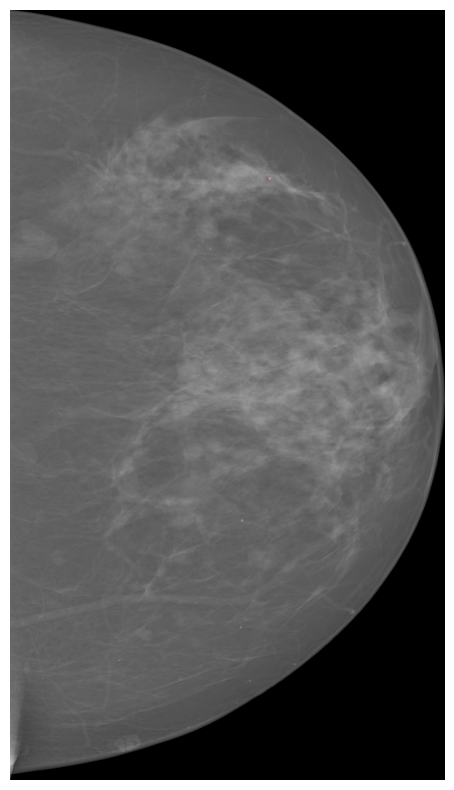

In [102]:
simple_im_show(plot_bboxes_over_image(db[img_idx]['img'],[db[img_idx]['lesion_bboxes']],[(255,0,0)],['rect']))

In [4]:
def easy_plot(i: int):
    """Plots the original image and mask, of instance INBreast_Dataset

    Args:
        i (int): index of item
    """
    f,ax = plt.subplots(1,2,figsize=(8,6))
    ax[0].imshow(db[i]['img'], cmap='gray' )
    ax[1].imshow(db[i]['lesion_mask'])
    ax[0].axis('off')
    ax[1].axis('off')
    plt.show()

In [5]:
def gaus_plot(i,img_gaus):
    f,ax = plt.subplots(1,2,figsize=(8,6))
    ax[0].imshow(db[i]['img'], cmap='gray' )
    ax[1].imshow(img_gaus,cmap='gray')
    ax[0].axis('off')
    ax[1].axis('off')
    plt.show()

In [6]:
import seaborn as sns

def plot_img_hist(img,img_array):
    fig, ax = plt.subplots(1, 2, figsize=(15, 10))
    ax[0].imshow(img,cmap='gray')
    sns.histplot(img_array.flatten(), ax=ax[1], bins=1000, element='poly', alpha=0.2)
    ax[1].set_yscale("log")

In [7]:
def plot_blobs(image,image_blobs):
    f,ax = plt.subplots(1,1,figsize=(10,10))
    ax.imshow(image,cmap='gray')
    for blob in tqdm(image_blobs):
        y,x,r = blob
        c = plt.Circle((x, y), r, color='yellow', linewidth=1, fill=False)
        ax.add_patch(c)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [8]:
def norm_image(image):
    return (image-image.min())/(image.max()-image.min()) # image normalization

In [9]:
def cal_det_se(no_tp,no_fn):
    return no_tp/(no_tp+no_fn)

def fp_per_unit_area(image_shape,no_fp):
    return no_fp/(image_shape[0] * image_shape[1] * (0.070**2)/100)

In [10]:
def quick_circle_comparison(true_bboxes, predicted_roi_circles, mask, n_jobs=6):
    """Finds TP, FP and number of FN for a prediction of circles given image mask

    Args:
        true_bboxes (np.ndarray): Array of shape (n_rois, 2) containing
            tl and br bbox coordinates in tuples
        predicted_roi_circles (np.ndarray): Array of shape (n_predicted_circ, 3)
            with circle_x, circle_y and circle_radius values
        mask (np.ndarray): Image mask containing indexes of rois

    Returns:
        TP (set): contains TP roi indexes
        FP (int): contains FP circle indexes (thate weren't mapped to any rois)
        FN (int): number of rois not mapped to any of the predicted circles
    """
    TP = []
    FP = 0
    FN = 0
    
    for circle in predicted_roi_circles.astype(int):
        cricle_tl = (max(0, circle[0] - circle[2]), max(0, circle[1] - circle[2]))
        circle_br = (min(mask.shape[1], circle[0] + circle[2]), min(mask.shape[0], circle[1] + circle[2]))
        
        intersected_mask_idxs = np.unique(mask[cricle_tl[1]:circle_br[1], cricle_tl[0]:circle_br[0]])
        if intersected_mask_idxs.sum()>0:
            TP.extend(intersected_mask_idxs)
        else:
            FP+=1
    TP = set(np.unique(TP)).difference(set([0]))
    FN = len(true_bboxes) - len(TP)
    return TP, FP, FN

In [11]:
def circle_comparison(true_bboxes, predicted_roi_circles, mask):
    """Finds TP, FP and number of FN for a prediction of circles given image mask

    Args:
        true_bboxes (np.ndarray): Array of shape (n_rois, 2) containing
            tl and br bbox coordinates in tuples
        predicted_roi_circles (np.ndarray): Array of shape (n_predicted_circ, 3)
            with circle_x, circle_y and circle_radius values
        mask (np.ndarray): Image mask containing indexes of rois

    Returns:
        TP (set): contains TP roi indexes
        FP (set): contains FP circle indexes (that weren't mapped to any rois)
        FN (int): number of rois not mapped to any of the predicted circles
    """
    TP = set()
    FP = []

    true_mask = mask

    for circle_idx, circle in enumerate(tqdm(predicted_roi_circles.astype(int))):
        circle_roi_mask=cv2.circle(np.zeros(mask.shape),
                                     (circle[0], circle[1]),
                                     circle[2], 1, -1).astype(np.bool8)

        mapped_rois_idxs=set(
            np.unique(true_mask[circle_roi_mask])).difference(set([0]))
        if len(mapped_rois_idxs) > 0:
            TP = TP.union(mapped_rois_idxs)
        else:
            FP.append(circle_idx)
    FN = len(true_bboxes) - len(TP)
    return TP, FP, FN

#### Gaussian blurr

#### Checking DogG

In [74]:
image = norm_image(db[img_idx]['img'])
img_blurred_h_l = cv2.GaussianBlur(image,g_kernel_size,sigmaX=sigma_array[1]) - cv2.GaussianBlur(image,g_kernel_size,sigmaX=sigma_array[0])
img_blurred_l_h = cv2.GaussianBlur(image,g_kernel_size,sigmaX=sigma_array[0]) - cv2.GaussianBlur(image,g_kernel_size,sigmaX=sigma_array[1])

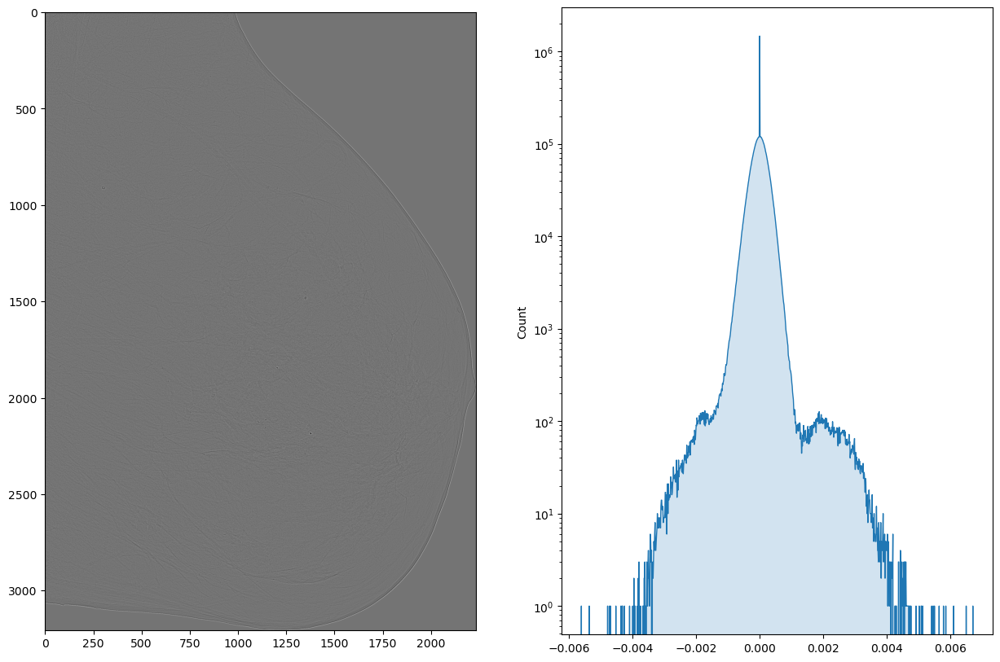

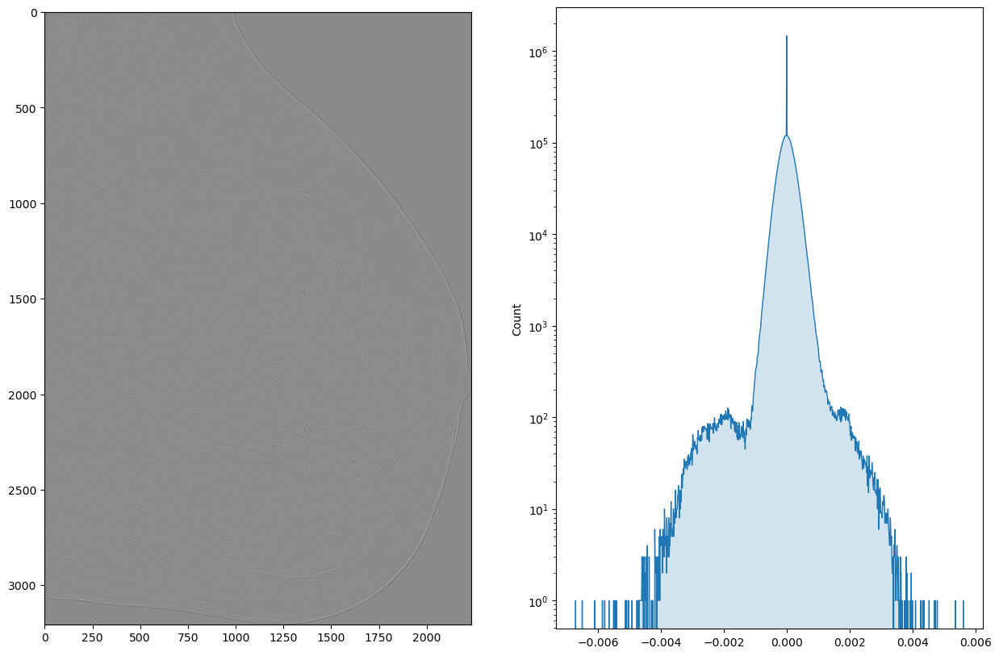

In [80]:
plot_img_hist(img_blurred_h_l)
plot_img_hist(img_blurred_l_h)

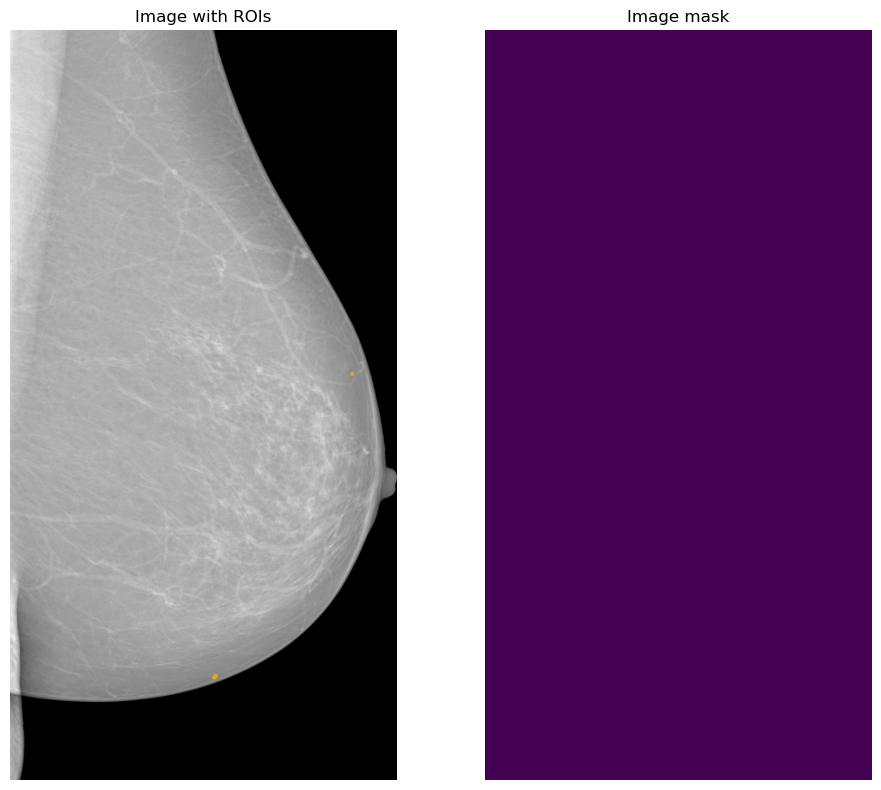

In [37]:
plot_img_rois(img_idx)

#### DoG

In [97]:
# CHECK THE ASCENDING OR DESCENDING ORDER OF SIGMA, IF K > 1 OR < 1

# #g_kernel_size = (25,25)
# k = 1.05
# n_scales = 20
# #sigma_array = np.linspace(1.18,3.1,21)
# sigma_array = np.array([1.18*(k**n) for n in range(n_scales+1)]) # np.flip
# print(f'Sigma array: {sigma_array}')


Sigma array: [1.18       1.239      1.30095    1.3659975  1.43429738 1.50601224
 1.58131286 1.6603785  1.74339742 1.83056729 1.92209566 2.01820044
 2.11911046 2.22506599 2.33631929 2.45313525 2.57579201 2.70458162
 2.8398107  2.98180123 3.13089129]


In [92]:
# image = norm_image(db[img_idx]['img'])
# img_dog = []

# for idx in range(sigma_array.shape[0]-2,-1,-1):
#     #print(idx)
#     norm = sigma_array[idx]/(sigma_array[idx]-sigma_array[idx+1])
#     #print(norm)
#     dog = norm*(cv2.GaussianBlur(image,ksize=(0,0),sigmaX=sigma_array[idx+1]) - cv2.GaussianBlur(image,ksize=(0,0),sigmaX=sigma_array[idx]))
#     img_dog.append(dog)
# img_dog = np.asarray(img_dog)
# print(f'Scale-space DoG shape: {img_dog.shape}')

21.000000000000018
20.999999999999943
21.000000000000025
20.999999999999964
20.99999999999994
20.999999999999957
21.000000000000007
20.999999999999993
21.000000000000007
20.999999999999986
20.99999999999999
20.999999999999993
20.999999999999936
20.99999999999996
21.000000000000014
21.000000000000025
20.999999999999915
21.00000000000007
20.999999999999893
21.000000000000018
Scale-space DoG shape: (20, 3205, 2232)


In [13]:
k = 1.05
n_scales = 20
sf = 1/(k-1)
min_sigma = 1.18

image = norm_image(db[img_idx]['img']) #*(2**8)).astype(np.uint8)

sigma_array = np.array([min_sigma*(k**n) for n in range(n_scales+1)]) # np.flip
print(f'Sigma array: {sigma_array}')

gaussian_images = [gaussian_filter(image, s, mode='reflect') for s in sigma_array]

img_dog = [sf*(gaussian_images[i] - gaussian_images[i+1]) for i in range(n_scales)]
img_dog = np.asarray(img_dog)
print(f'Scale-space DoG shape: {img_dog.shape}')

Sigma array: [1.18       1.239      1.30095    1.3659975  1.43429738 1.50601224
 1.58131286 1.6603785  1.74339742 1.83056729 1.92209566 2.01820044
 2.11911046 2.22506599 2.33631929 2.45313525 2.57579201 2.70458162
 2.8398107  2.98180123 3.13089129]
Scale-space DoG shape: (20, 3463, 1954)


#### Histogram plots of DoGs

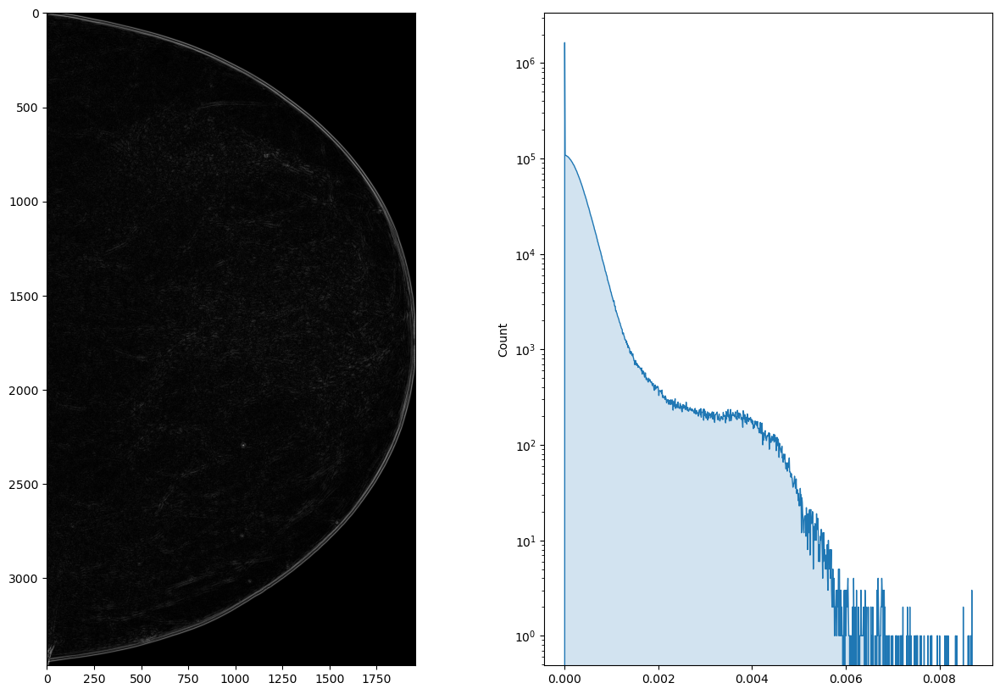

In [18]:
plot_img_hist(np.abs(img_dog[19]-img_dog[18]),np.abs(img_dog[19]-img_dog[18]))

In [ ]:
plot_img_hist(np.abs(img_dog[19]-img_dog[18]),np.abs(img_dog[19]-img_dog[18]))

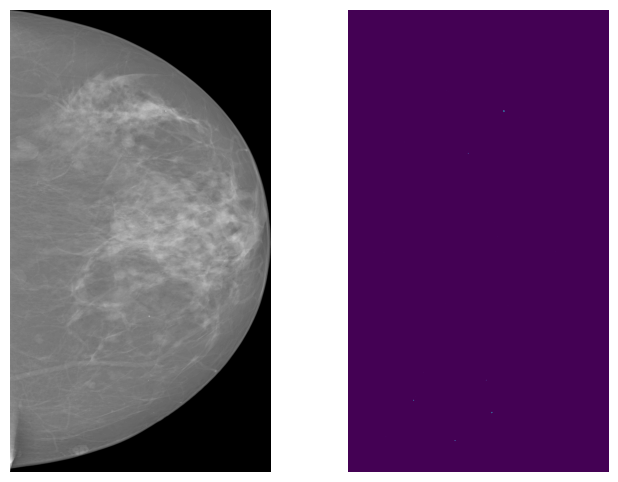

Number of calicifications in original image: 42


In [108]:
# easy_plot(0)
# print(f'Number of calicifications in original image: {db.df.iloc[0,1]}')

#### Local Maxima

In [11]:
from scipy import ndimage, misc

In [104]:
np.array([0,1,2,3,4,5,6,7,8]).shape[0]//2

4

In [14]:
#filtering 
#img_dog_lm = ndimage.maximum_filter(img_dog,size=(3,3,3),mode='constant')

def compare_max(window: np.ndarray,t_dog = 0.006):
    element = window[window.shape[0]//2]
    return element if (element >= window.max()) and (element > t_dog) else 0


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 1., 3., 2., 1., 0., 0., 0.],
       [0., 0., 0., 1., 1., 1., 1., 1., 0., 0., 0.],
       [0., 0., 0., 1., 1., 1., 1., 1., 0., 0., 0.],
       [0., 0., 0., 1., 1., 1., 1., 1., 0., 0., 0.],
       [0., 0., 0., 1., 1., 1., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [17]:
#img_dog_lm = ndimage.generic_filter(img_dog,compare_max,size=(3,3,3),mode='constant')   

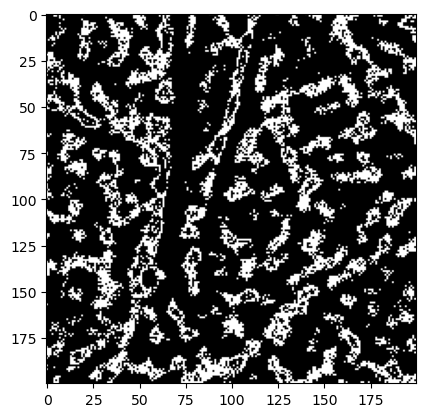

In [35]:
#plt.imshow(img_dog_lm[0][100:300,100:300],cmap='gray')

#### Blob det (skimage)


In [14]:
# Get blob coordinates and corresponding sigmas
#image = (norm_image(db[img_idx]['img'])*(2**16)).astype(np.uint16)

min_sigma = 1.18
max_sigma = 3.1
sigma_ratio = 1.05 # must be the same as k
t_dog = 0.006
overlap_dog = 1

img_blobs = blob_dog(image,min_sigma=min_sigma,max_sigma=max_sigma,sigma_ratio=sigma_ratio,threshold=t_dog,overlap=overlap_dog)

# blobs coordinates are [r,c,sigma]
print(img_blobs.shape)
print(img_blobs)


(135832, 3)
[[3.45000000e+03 0.00000000e+00 2.98180123e+00]
 [7.58000000e+02 1.16600000e+03 2.98180123e+00]
 [3.45900000e+03 0.00000000e+00 1.58131286e+00]
 ...
 [2.62400000e+03 9.91000000e+02 1.18000000e+00]
 [1.82100000e+03 2.00000000e+01 1.18000000e+00]
 [2.44200000e+03 8.79000000e+02 1.18000000e+00]]


In [29]:
# hessian matrix of dog scale-space with condition mask
h_thr = 1.4
img_hdog_filter = []
condition_list = []
det_list = []
# sigma_array_copy = np.flip(sigma_array.copy())
# sigma_array_copy = sigma_array_copy[:-1] # sigma_array_copy[1:]

print('Gettin hessian...')
for sigma_idx,dog in enumerate(tqdm(img_dog)):
    hrr,hrc,hcc = hessian_matrix((norm_image(dog)*(2**16)).astype(np.uint16),sigma=sigma_array[sigma_idx],mode='constant') #
    trace = hrr + hcc
    #print(f'trace min: {trace.min()}, max: {trace.max()}')    
    det = (hrr*hcc) - hrc**2 #hessian_matrix_det(dog)
    #print(f'det min: {det.min()}, max: {det.max()}')
    #condition = np.abs(det)/(trace**2)
    #print(f'condition max: {condition.max()}')
    #hessian_mask = ((trace < 0) & ((det < 0) | (np.abs(det)/(trace**2) <= h_thr)))
    hessian_mask = (trace < 0 & ((det < 0) | (np.abs(det)/(trace**2) <= h_thr)))
    # det_list.append(det)
    # condition_list.append(condition)
    img_hdog_filter.append(hessian_mask)
    #break
img_hdog_filter = np.asarray(img_hdog_filter)
# condition_list = np.asarray(condition_list)
# det_list = np.asarray(det_list)
print(f'{img_hdog_filter.shape}')

# Selection of  blobs
print('Filtering out blobs...')
blobs_filtered = []
blob_coords = img_blobs[:,:2].astype(int)

for blob_index,blob_sigma in enumerate(tqdm(img_blobs[:,2])):
    # print(blob)
    hess_mask = img_hdog_filter[np.where(sigma_array == blob_sigma)][0]
    if hess_mask[blob_coords[blob_index][0],blob_coords[blob_index][1]]:
        blobs_filtered.append([blob_coords[blob_index][0],blob_coords[blob_index][1],blob_sigma]) 

#blobs_filtered = np.asarray(blobs_filtered)   

print(f'Filtered blobs: {np.shape(blobs_filtered)}')

Gettin hessian...


  0%|          | 0/20 [00:00<?, ?it/s]/tmp/ipykernel_1189/2594655807.py:19: RuntimeWarning: divide by zero encountered in true_divide
  hessian_mask = (trace < 0 & ((det < 0) | (np.abs(det)/(trace**2) <= h_thr)))
/tmp/ipykernel_1189/2594655807.py:19: RuntimeWarning: invalid value encountered in true_divide
  hessian_mask = (trace < 0 & ((det < 0) | (np.abs(det)/(trace**2) <= h_thr)))
100%|██████████| 20/20 [00:10<00:00,  1.97it/s]


(20, 3463, 1954)
Filtering out blobs...


100%|██████████| 135839/135839 [01:43<00:00, 1317.02it/s]

Filtered blobs: (24, 3)


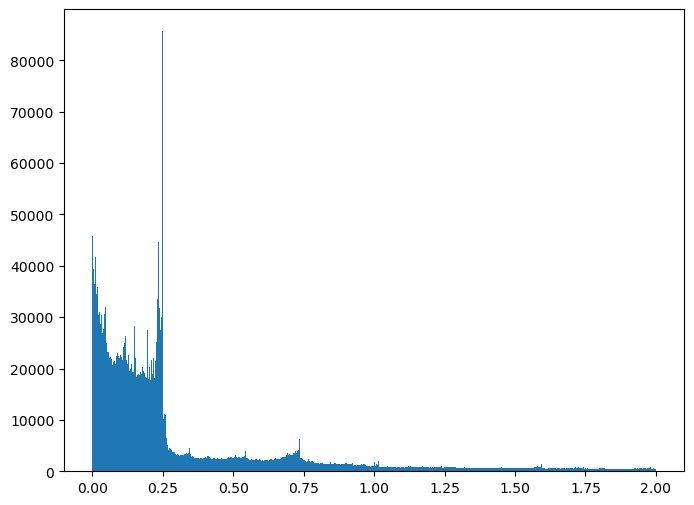

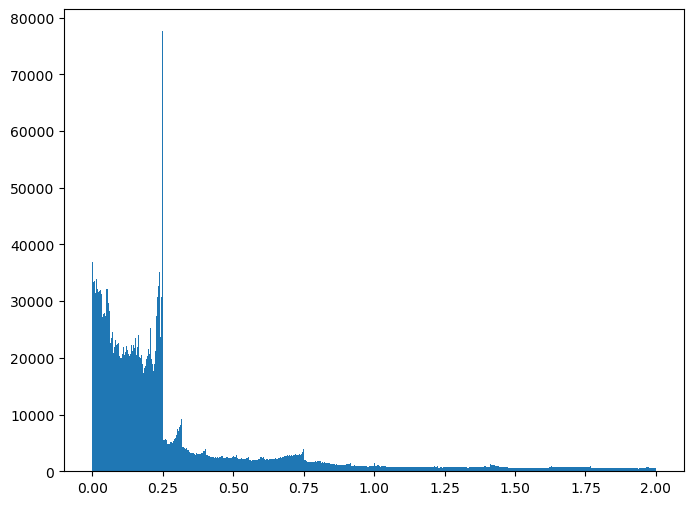

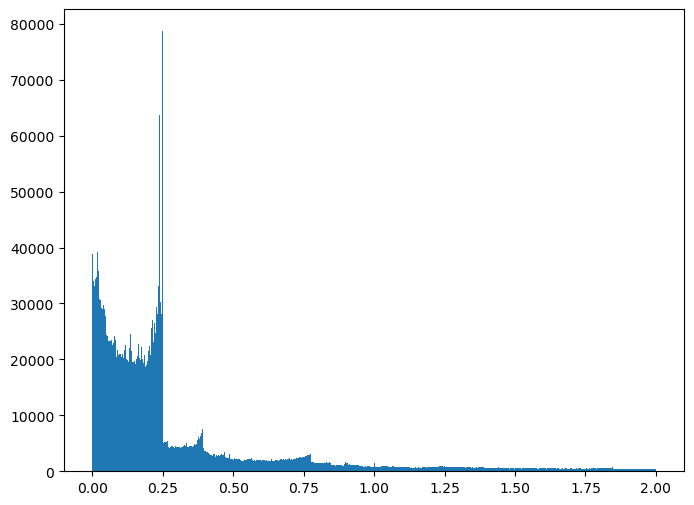

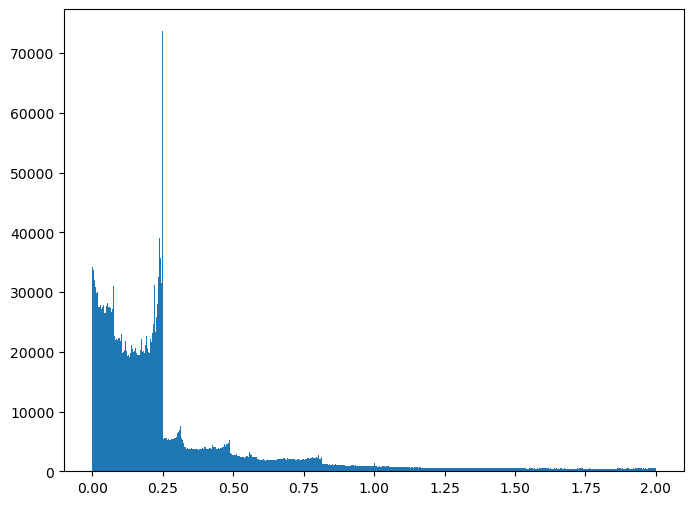

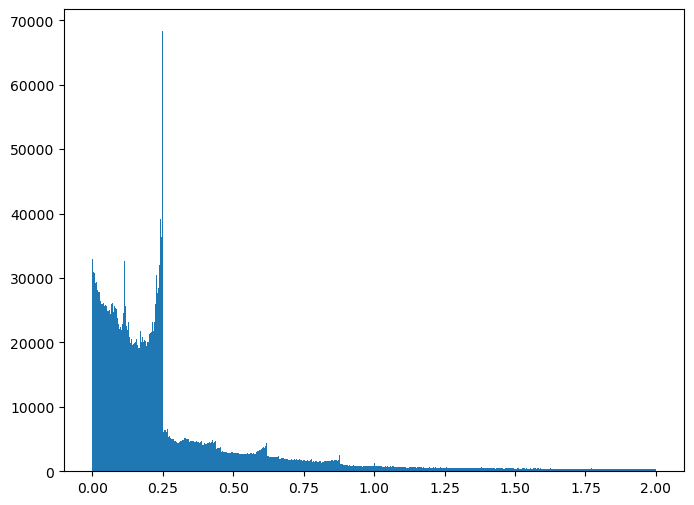

...

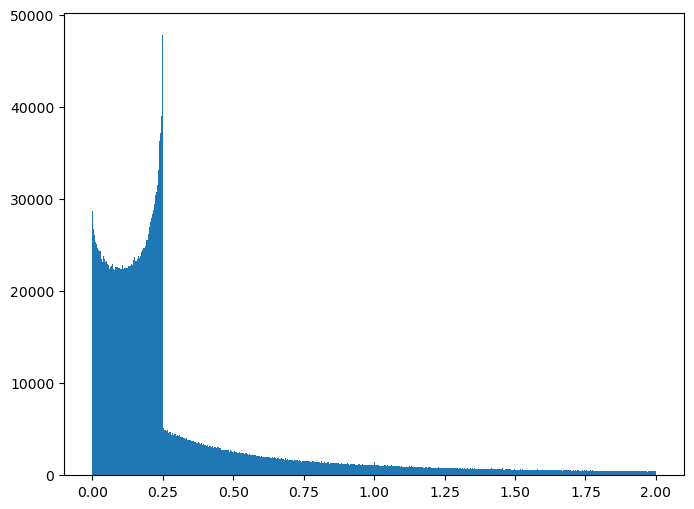

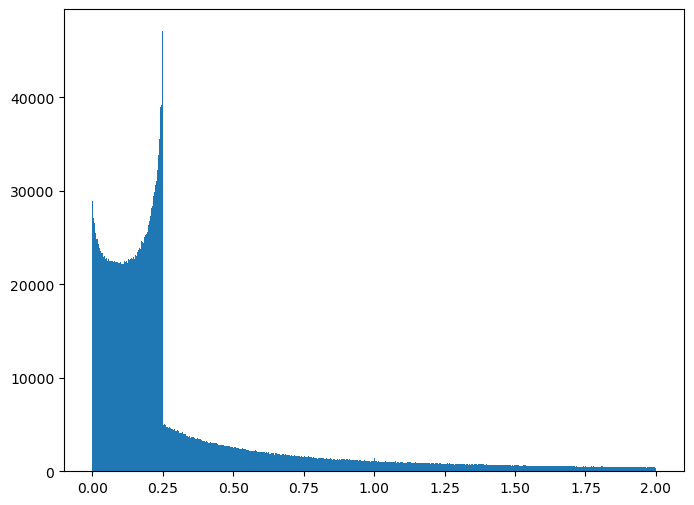

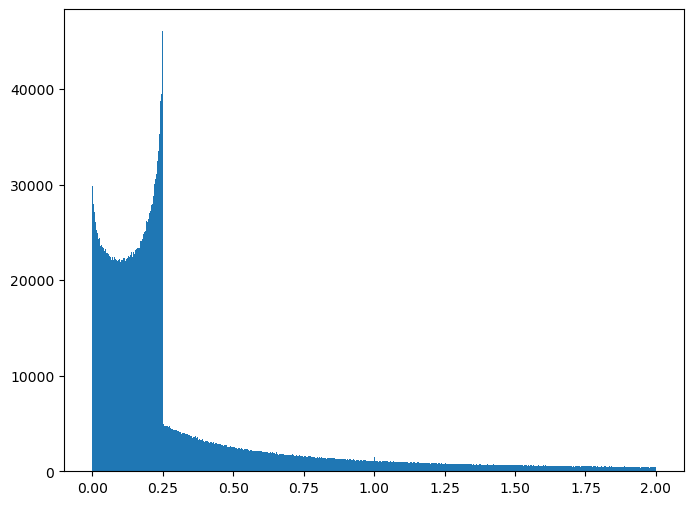

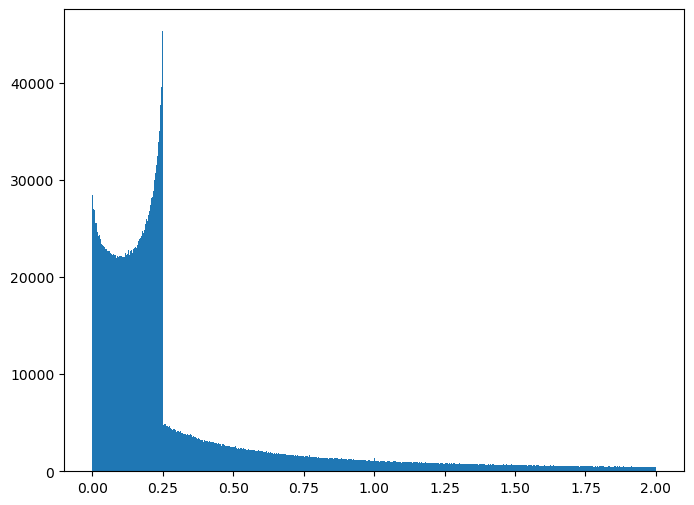

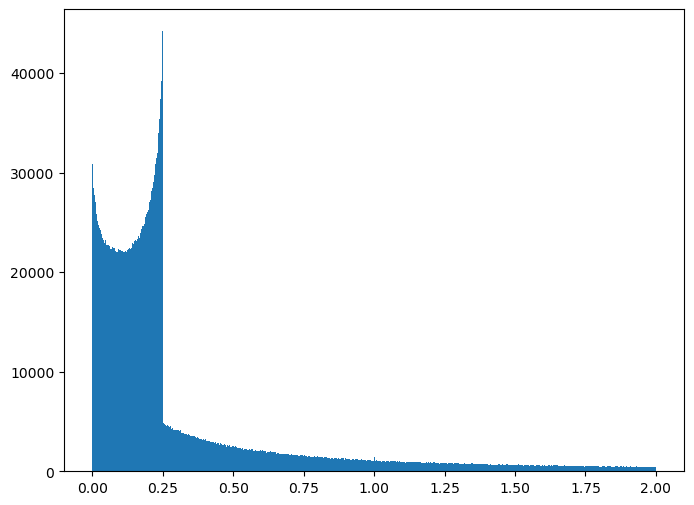

In [17]:
for condition_x in condition_list:
    fig, ax = plt.subplots(figsize=(8, 6))
    plt.hist(condition_x[~np.isnan(condition_x) & (~np.isinf(condition_x)) & (condition_x != 0) & (condition_x < 2)],bins=1000)
    plt.show()

In [15]:
# hessian matrix of dog scale-space with condition mask
h_eig_thr = 0
img_hdog_filter = []
img_eigenvalues = []
# sigma_array_copy = np.flip(sigma_array.copy())
# sigma_array_copy = sigma_array_copy[:-1] # sigma_array_copy[1:]

# New condition with large negative eigenvalues only
print('Gettin hessian...')
for sigma_idx,dog in enumerate(tqdm(img_dog)):
    H_elems = hessian_matrix(dog,sigma=sigma_array[sigma_idx],mode='constant') #
    eigenvalues = hessian_matrix_eigvals(H_elems)
    hessian_mask = ((eigenvalues[0] < h_eig_thr) & (eigenvalues[1] < h_eig_thr))
    # hessian_mask = ((eigenvalues[0] < 0) & (np.abs(eigenvalues[0]) > h_eig_thr) & (eigenvalues[1] < 0) & (np.abs(eigenvalues[1]) > h_eig_thr))
    img_hdog_filter.append(hessian_mask)
    img_eigenvalues.append(eigenvalues)
    #break
img_hdog_filter = np.asarray(img_hdog_filter)
img_eigenvalues = np.asarray(img_eigenvalues)
#print(f'{img_hdog_filter.shape}')

# Selection of  blobs
print('Filtering out blobs...')
blobs_filtered = []
blob_coords = img_blobs[:,:2].astype(int)

for blob_index,blob_sigma in enumerate(tqdm(img_blobs[:,2])):
    # print(blob)
    hess_mask = img_hdog_filter[np.where(sigma_array == blob_sigma)][0]
    if hess_mask[blob_coords[blob_index][0],blob_coords[blob_index][1]]:
        blobs_filtered.append([blob_coords[blob_index][0],blob_coords[blob_index][1],blob_sigma]) 

#blobs_filtered = np.asarray(blobs_filtered)   

print(f'Filtered blobs: {np.shape(blobs_filtered)}')

Gettin hessian...


100%|██████████| 20/20 [00:09<00:00,  2.01it/s]


Filtering out blobs...


100%|██████████| 135832/135832 [01:19<00:00, 1706.04it/s]

Filtered blobs: (126072, 3)


In [21]:
for eig in img_eigenvalues:
    total = eig[0].shape[0]*eig[0].shape[1]
    print(f' EIG1: max: {eig[0].max()}, min: {eig[0].min()}',f' EIG2: max: {eig[1].max()}, min: {eig[1].min()}')
    print(f'EIG1.. < 0 : {(eig[0] < 0).sum()/total}',f'EIG2.. < 0 : {(eig[1] < 0).sum()/total}')
    print(f'EIG1.. >= 0 : {(eig[0] >= 0).sum()/total}',f'EIG2.. >= 0 : {(eig[1] >= 0).sum()/total}')

 EIG1: max: 755.81425666358, min: -723.477356817152  EIG2: max: 274.0395023865698, min: -1382.0916002807292
EIG1.. < 0 : 0.09193666279378049 EIG2.. < 0 : 0.6061715145723869
EIG1.. >= 0 : 0.9080633372062196 EIG2.. >= 0 : 0.39382848542761306
 EIG1: max: 726.5706396508689, min: -729.6907670766983  EIG2: max: 296.3928249217309, min: -1266.5899723017287
EIG1.. < 0 : 0.09439605881860913 EIG2.. < 0 : 0.6036030550776434
EIG1.. >= 0 : 0.9056039411813909 EIG2.. >= 0 : 0.39639694492235655
 EIG1: max: 631.3870811844948, min: -661.7374569407829  EIG2: max: 266.71903817438795, min: -1145.8442236602023
EIG1.. < 0 : 0.10054691340035367 EIG2.. < 0 : 0.6028475910421355
EIG1.. >= 0 : 0.8994530865996463 EIG2.. >= 0 : 0.3971524089578646
 EIG1: max: 541.2961246703076, min: -631.3452676021868  EIG2: max: 230.84656456421482, min: -1050.7658721194307
EIG1.. < 0 : 0.10476211306482833 EIG2.. < 0 : 0.6015908488359617
EIG1.. >= 0 : 0.8952378869351717 EIG2.. >= 0 : 0.39840915116403824
 EIG1: max: 513.4180953357154,

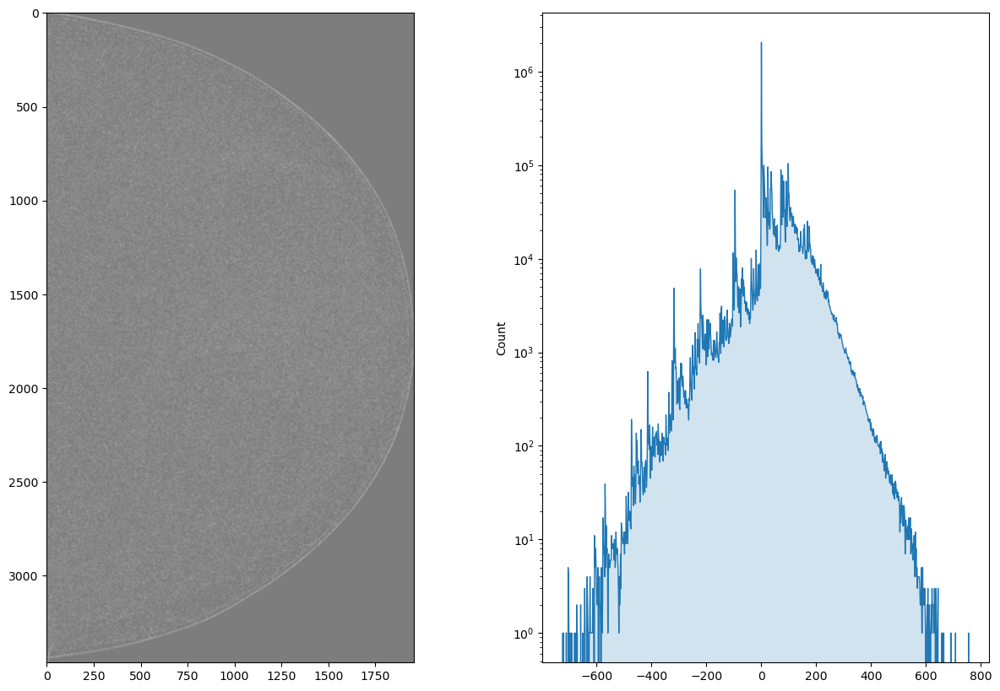

In [23]:
plot_img_hist(img_eigenvalues[0][0],img_eigenvalues[0][0]) #[(img_eigenvalues[0][0] < 0) & (img_eigenvalues[0][0] > -1)]

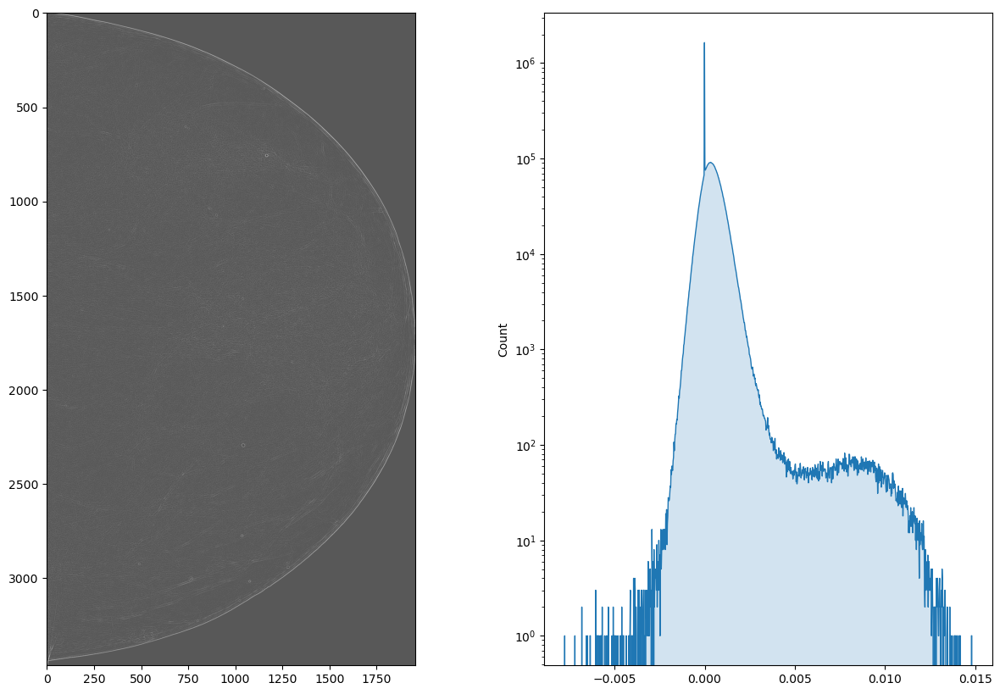

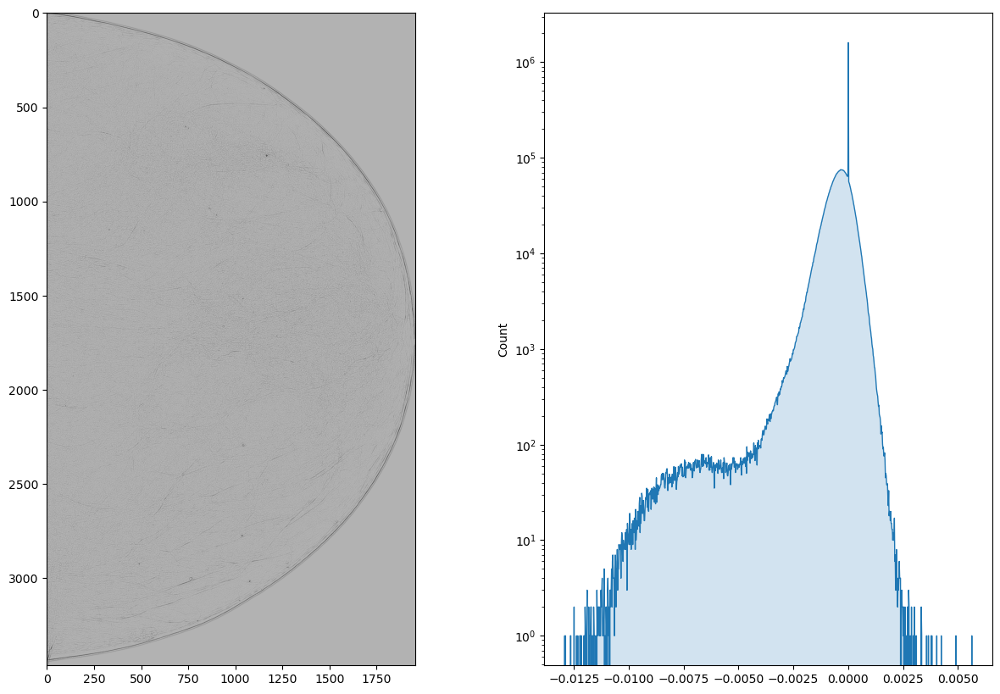

In [19]:
eig_scale = 5
plot_img_hist(img_eigenvalues[eig_scale][0],img_eigenvalues[eig_scale][0])
plot_img_hist(img_eigenvalues[eig_scale][1],img_eigenvalues[eig_scale][1])

In [40]:
for eig in img_eigenvalues:
    total = eig[0].shape[0]*eig[0].shape[1]
    thr = 20
    # print(f'Condition eig1: {((eig[0] < 0) & (np.abs(eig[0]) > h_eig_thr)).sum()/total}',f'Condition eig2: {((eig[1] < 0) & (np.abs(eig[1]) > h_eig_thr)).sum()/total}')
    # print(f'Gen condition: {((eig[0] < 0) & (np.abs(eig[0]) > h_eig_thr) & (eig[1] < 0) & (np.abs(eig[1]) > h_eig_thr)).sum()/total}')
    print(f'eig 1 > {thr}: {(np.abs(eig[0]) > thr).sum()/total}',f' eig 2 > {thr}: {(np.abs(eig[1]) > thr).sum()/total}')

eig 1 > 20: 0.5583658036071338  eig 2 > 20: 0.3634179545663456
eig 1 > 20: 0.5653265061768643  eig 2 > 20: 0.36933812069749783
eig 1 > 20: 0.5572101446169788  eig 2 > 20: 0.36028082809025724
eig 1 > 20: 0.563097798602628  eig 2 > 20: 0.3593780249226285
eig 1 > 20: 0.5594437290130406  eig 2 > 20: 0.3482967034753415
eig 1 > 20: 0.5572377799406565  eig 2 > 20: 0.3462370590577212
eig 1 > 20: 0.547246206497641  eig 2 > 20: 0.33707883101694147
eig 1 > 20: 0.5328777593575127  eig 2 > 20: 0.3288845880903282
eig 1 > 20: 0.5105472355661591  eig 2 > 20: 0.3164421900062985
eig 1 > 20: 0.49547962951523505  eig 2 > 20: 0.30579771356858926
eig 1 > 20: 0.45222960904736165  eig 2 > 20: 0.2866386017885818
eig 1 > 20: 0.41000682459490606  eig 2 > 20: 0.2694408590772876
eig 1 > 20: 0.3728609594452364  eig 2 > 20: 0.2463613736795266
eig 1 > 20: 0.3315081704499474  eig 2 > 20: 0.22460867938325052
eig 1 > 20: 0.2887013496382728  eig 2 > 20: 0.20170269061649235
eig 1 > 20: 0.2435499597883873  eig 2 > 20: 0.17

##### Hessian eigs multiscale product

In [36]:
k = 1.05
n_scales = 21
sf = 1/(k-1)
min_sigma = 1.18

image = norm_image(db[0]['img']) #*(2**8)).astype(np.uint8)

sigma_array = np.array([min_sigma*(k**n) for n in range(n_scales+1)]) # np.flip
print(f'Sigma array: {sigma_array}')

gaussian_images = [gaussian_filter(image, s, mode='reflect') for s in sigma_array]

img_dog = [sf*(gaussian_images[i] - gaussian_images[i+1]) for i in range(n_scales)]
img_dog = np.asarray(img_dog)
print(f'Scale-space DoG shape: {img_dog.shape}')

Sigma array: [1.18       1.239      1.30095    1.3659975  1.43429738 1.50601224
 1.58131286 1.6603785  1.74339742 1.83056729 1.92209566 2.01820044
 2.11911046 2.22506599 2.33631929 2.45313525 2.57579201 2.70458162
 2.8398107  2.98180123 3.13089129 3.28743586]
Scale-space DoG shape: (21, 3463, 1954)


In [37]:
# Get blob coordinates and corresponding sigmas
#image = (norm_image(db[img_idx]['img'])*(2**16)).astype(np.uint16)

min_sigma = 1.18
max_sigma = 3.1
sigma_ratio = 1.05 # must be the same as k
t_dog = 0.006
overlap_dog = 1

img_blobs = blob_dog(image,min_sigma=min_sigma,max_sigma=max_sigma,sigma_ratio=sigma_ratio,threshold=t_dog,overlap=overlap_dog)

# blobs coordinates are [r,c,sigma]
print(img_blobs.shape)
print(img_blobs)

(135832, 3)
[[3.45000000e+03 0.00000000e+00 2.98180123e+00]
 [7.58000000e+02 1.16600000e+03 2.98180123e+00]
 [3.45900000e+03 0.00000000e+00 1.58131286e+00]
 ...
 [2.62400000e+03 9.91000000e+02 1.18000000e+00]
 [1.82100000e+03 2.00000000e+01 1.18000000e+00]
 [2.44200000e+03 8.79000000e+02 1.18000000e+00]]


In [38]:
# hessian matrix of dog scale-space with condition mask
h_eig_thr = 1.4
img_eigenvalues = []

# sigma_array_copy = np.flip(sigma_array.copy())
# sigma_array_copy = sigma_array_copy[:-1] # sigma_array_copy[1:]

# New condition with large negative eigenvalues only MULTISCALE CONDITION
print('Gettin hessian...')
for sigma_idx,dog in enumerate(tqdm(img_dog)):
    H_elems = hessian_matrix(dog,sigma=sigma_array[sigma_idx],mode='constant') #
    eigenvalues = hessian_matrix_eigvals(H_elems)
    img_eigenvalues.append(eigenvalues)
    #break
img_eigenvalues = np.asarray(img_eigenvalues)
print(f'{img_eigenvalues.shape}')

Gettin hessian...


100%|██████████| 21/21 [00:12<00:00,  1.69it/s]


(21, 2, 3463, 1954)


In [16]:
print(img_eigenvalues[0][0].max())
print(img_eigenvalues[0][0].min())

0.020823059496541063
-0.009165313919713798


In [30]:
plot_img_hist(img_eigenvalues[0][0],)

(21, 2, 3463, 1954)

In [ ]:
for i in range(20):
    print(f'eig1, scale {i}',(img_eigenvalues[i][0]*img_eigenvalues[i+1][0]).max())
    print(f'eig2, scale {i}',(img_eigenvalues[i][1]*img_eigenvalues[i+1][1]).max())

In [39]:
#for k in range(20,110,10):
k = 100
img_hdog_filter = []
ms_eigs = []
for idx in range(img_eigenvalues.shape[0]-1):
    eig1_ms = img_eigenvalues[idx][0] * img_eigenvalues[idx+1][0] #(norm_image(img_eigenvalues[idx][0])*(2**8)) * (norm_image(img_eigenvalues[idx+1][0])*(2**8))
    eig2_ms = img_eigenvalues[idx][1] * img_eigenvalues[idx+1][1] #(norm_image(img_eigenvalues[idx][1])*(2**8)) * (norm_image(img_eigenvalues[idx+1][1])*(2**8))
    thrs_1 = np.max(eig1_ms)/k
    #print(thrs_1)
    thrs_2 = np.max(eig2_ms)/k
    #print(thrs_2)
    hessian_mask = (eig1_ms > thrs_1) & (eig2_ms > thrs_2)
    img_hdog_filter.append(hessian_mask)
    ms_eigs.append([eig1_ms,eig2_ms])
    #break
img_hdog_filter = np.asarray(img_hdog_filter)
ms_eigs = np.asarray(ms_eigs)

# Selection of  blobs
print(f'Filtering out blobs...w/k = {k}')
blobs_filtered = []
blob_coords = img_blobs[:,:2].astype(int)

for blob_index,blob_sigma in enumerate(tqdm(img_blobs[:,2])):
    # print(blob)
    hess_mask = img_hdog_filter[np.where(sigma_array == blob_sigma)][0]
    if hess_mask[blob_coords[blob_index][0],blob_coords[blob_index][1]]:
        blobs_filtered.append([blob_coords[blob_index][0],blob_coords[blob_index][1],blob_sigma]) 

#blobs_filtered = np.asarray(blobs_filtered)   

print(f'Filtered blobs: {np.shape(blobs_filtered)}')

Filtering out blobs...w/k = 100


100%|██████████| 135832/135832 [01:27<00:00, 1555.66it/s]

Filtered blobs: (1725, 3)


In [40]:
blob_list_arr = np.array(blobs_filtered.copy())
blob_list_arr[:,2] = blob_list_arr[:,2]*sqrt(2)
blob_list_arr[:,[0, 1]] = blob_list_arr[:,[1, 0]]

TP, FP, FN = quick_circle_comparison(db[img_idx]['lesion_bboxes'],(blob_list_arr).astype(int),db[img_idx]['lesion_mask'])
no_fp = FP
no_tp = len(TP)
no_fn = FN
print(f'Sensitivity of image {img_idx}: {cal_det_se(no_tp,no_fn)}')
fp_pua = fp_per_unit_area(db[img_idx]['img'].shape,no_fp)
print(f'FP per unit area (sqr cm): {fp_pua}')

Sensitivity of image 0: 0.918918918918919
FP per unit area (sqr cm): 5.090955622375085


In [23]:
for i in range(ms_eigs.shape[0]):
    print(f'Max: {ms_eigs[i][0].max()}, thresh: {ms_eigs[i][0].max()/100}, values > thresh: {(ms_eigs[i][0] > ms_eigs[i][0].max()/100).sum()}')

Max: 0.0004101675837853079, thresh: 4.101675837853079e-06, values > thresh: 247469
Max: 0.0003631144930912796, thresh: 3.631144930912796e-06, values > thresh: 239132
Max: 0.00031473105465899066, thresh: 3.1473105465899066e-06, values > thresh: 240481
Max: 0.00026633885237157905, thresh: 2.6633885237157905e-06, values > thresh: 251630
Max: 0.00023195375142883793, thresh: 2.3195375142883795e-06, values > thresh: 247441
Max: 0.00020781802949653891, thresh: 2.078180294965389e-06, values > thresh: 231840
Max: 0.00018410197840842987, thresh: 1.8410197840842986e-06, values > thresh: 221722
Max: 0.0001593698776223109, thresh: 1.593698776223109e-06, values > thresh: 220371
Max: 0.00013491240261349736, thresh: 1.3491240261349737e-06, values > thresh: 228666
Max: 0.00011758640774310341, thresh: 1.1758640774310342e-06, values > thresh: 225562
Max: 0.00010289976524313122, thresh: 1.0289976524313123e-06, values > thresh: 220104
Max: 8.855998340974916e-05, thresh: 8.855998340974916e-07, values > thre

In [28]:
for i in range(ms_eigs.shape[0]):
    print(f'Max: {ms_eigs[i][1].max()}, thresh: {ms_eigs[i][1].max()/150}, values > thresh: {(ms_eigs[i][1] > ms_eigs[i][1].max()/150).sum()}')

Max: 0.0002975258953397717, thresh: 1.9835059689318114e-06, values > thresh: 803525
Max: 0.0002598331300048751, thresh: 1.7322208666991673e-06, values > thresh: 793372
Max: 0.00022965626835357565, thresh: 1.5310417890238377e-06, values > thresh: 770103
Max: 0.00019935095763713647, thresh: 1.3290063842475765e-06, values > thresh: 761422
Max: 0.00017275998683656855, thresh: 1.1517332455771237e-06, values > thresh: 750426
Max: 0.00016234644483571184, thresh: 1.082309632238079e-06, values > thresh: 669304
Max: 0.00015321625349874063, thresh: 1.0214416899916041e-06, values > thresh: 590765
Max: 0.00014274582288961314, thresh: 9.516388192640876e-07, values > thresh: 527787
Max: 0.00013328589777647528, thresh: 8.885726518431685e-07, values > thresh: 471072
Max: 0.00012265843764078718, thresh: 8.177229176052479e-07, values > thresh: 428736
Max: 0.0001111156647905155, thresh: 7.407710986034367e-07, values > thresh: 398936
Max: 0.00010041819193419193, thresh: 6.694546128946128e-07, values > thre

In [19]:
for i in range(ms_eigs.shape[0]):
    print(f'Max e1: {ms_eigs[i][0].max()}, Max e2: {ms_eigs[i][1].max()}')

Max e1: 388619.93549789133, Max e2: 1712570.7287994649
Max e1: 320299.80418443325, Max e2: 1166761.3791356264
Max e1: 211108.50409354494, Max e2: 940356.10693015
Max e1: 216490.3266644813, Max e2: 982982.1916091507
Max e1: 158101.5606940198, Max e2: 705961.134928158
Max e1: 130526.03888780085, Max e2: 580192.3559555669
Max e1: 130684.40419805881, Max e2: 452129.76831735787
Max e1: 115662.8036914249, Max e2: 481916.0852578223
Max e1: 84468.26540486544, Max e2: 369201.02591394813
Max e1: 78485.21738132245, Max e2: 259345.49527461804
Max e1: 67942.44369665238, Max e2: 268615.73816894554
Max e1: 55466.65813738397, Max e2: 248475.16633747076
Max e1: 44849.496572810036, Max e2: 197124.3673801961
Max e1: 43015.986442532616, Max e2: 142398.25593485535
Max e1: 29700.030037495228, Max e2: 128460.71433610718
Max e1: 27299.65000137341, Max e2: 123772.49522078109
Max e1: 30822.956752368864, Max e2: 100386.5341147851
Max e1: 26256.3218228901, Max e2: 74464.56708492253
Max e1: 18601.15501174236, Max 

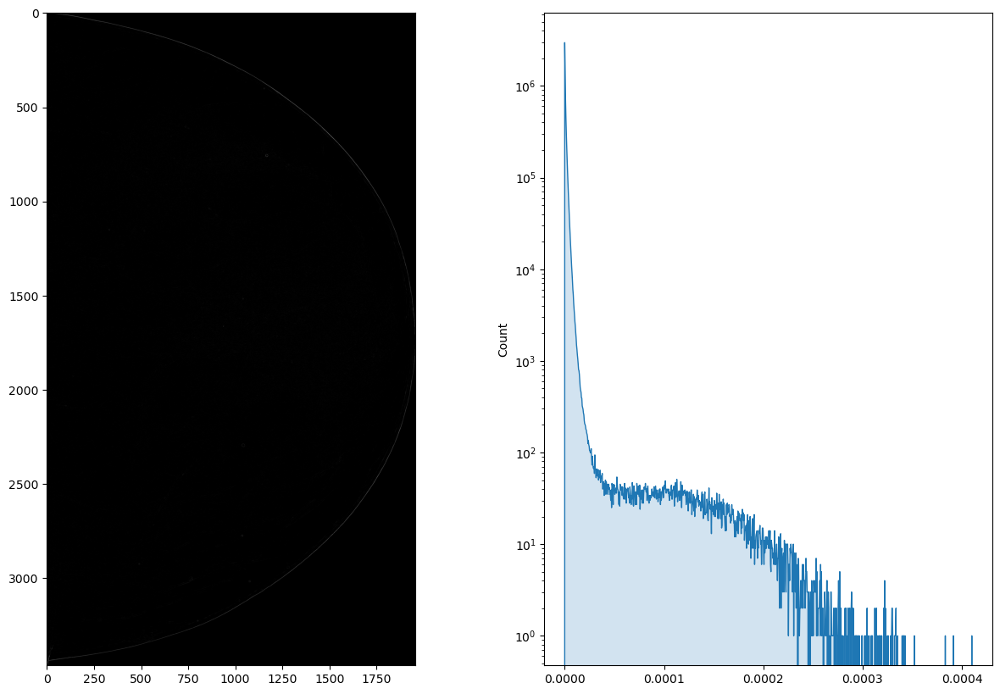

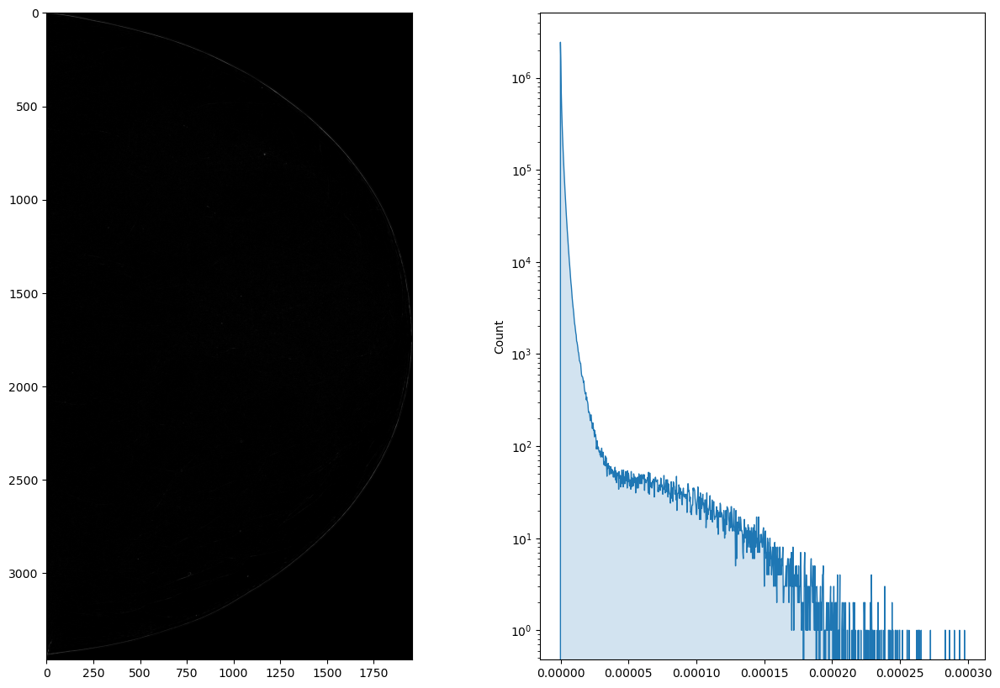

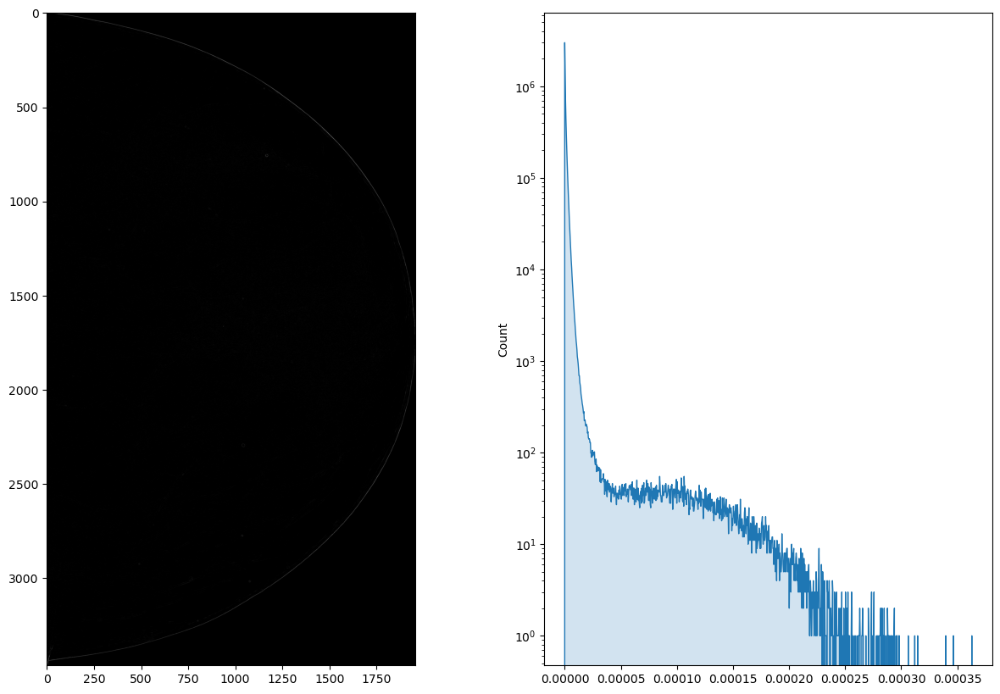

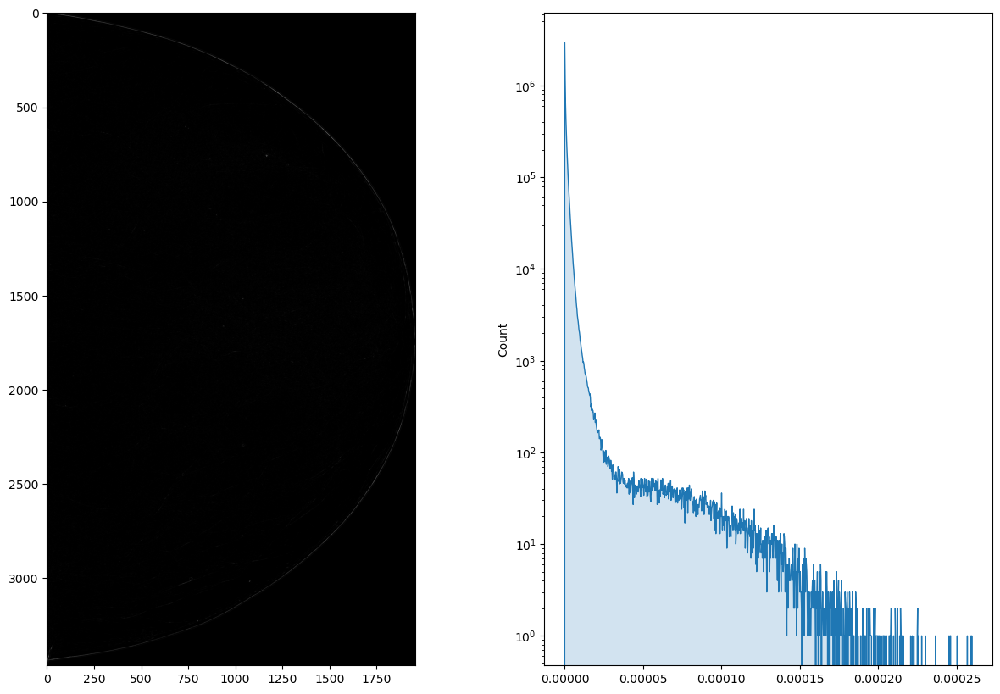

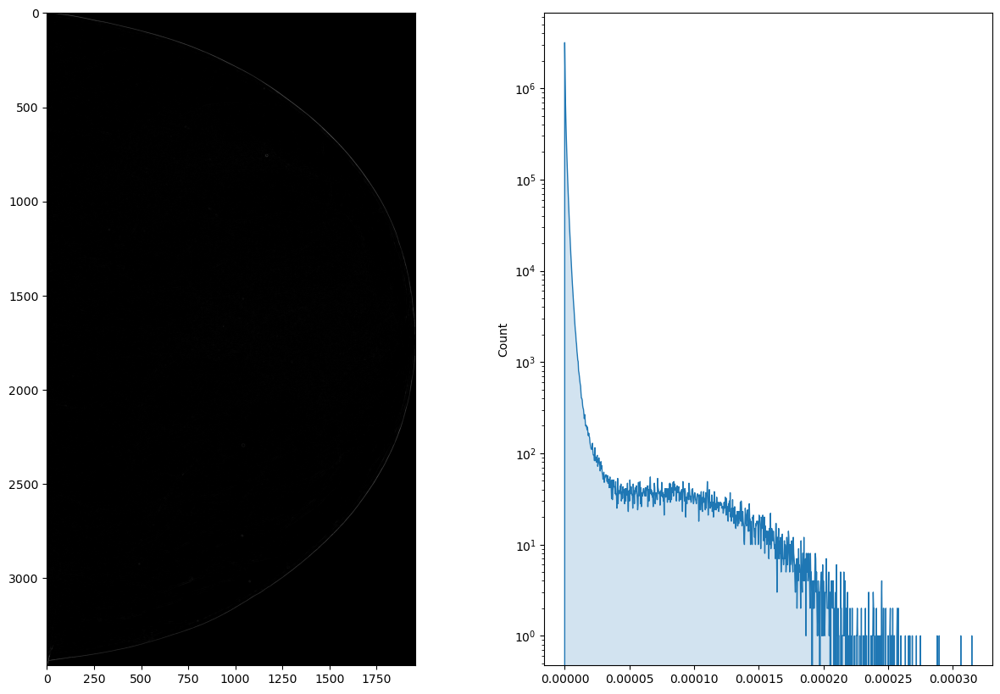

...

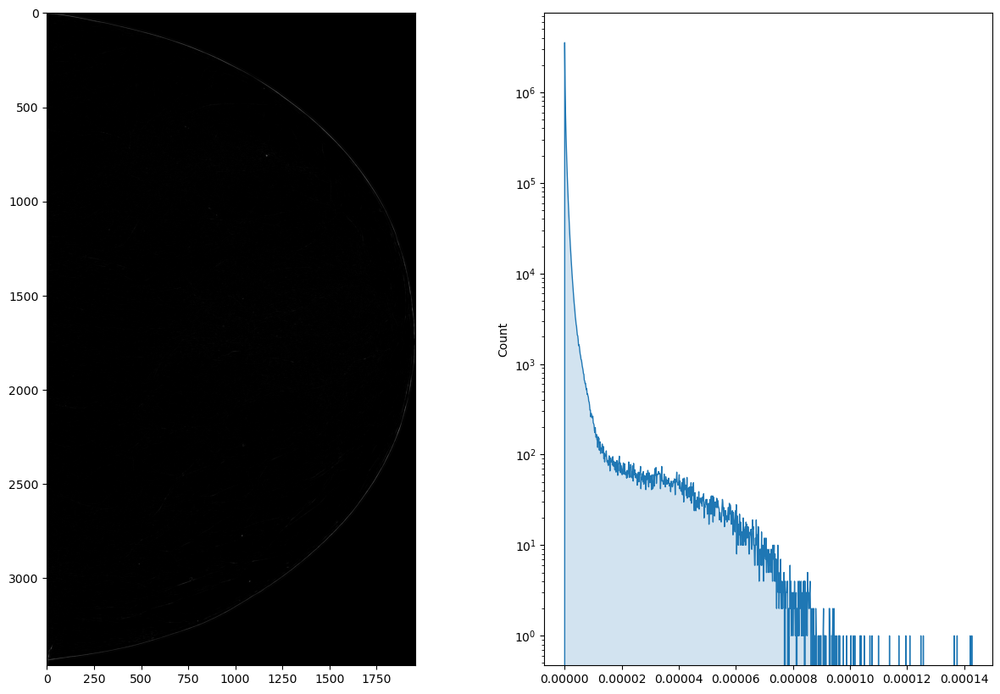

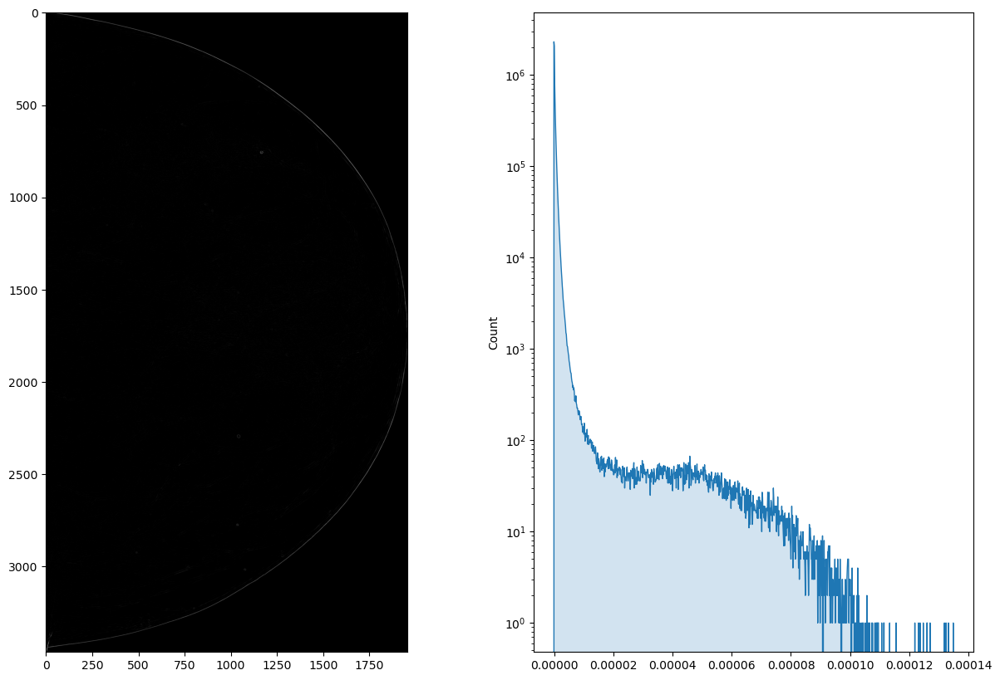

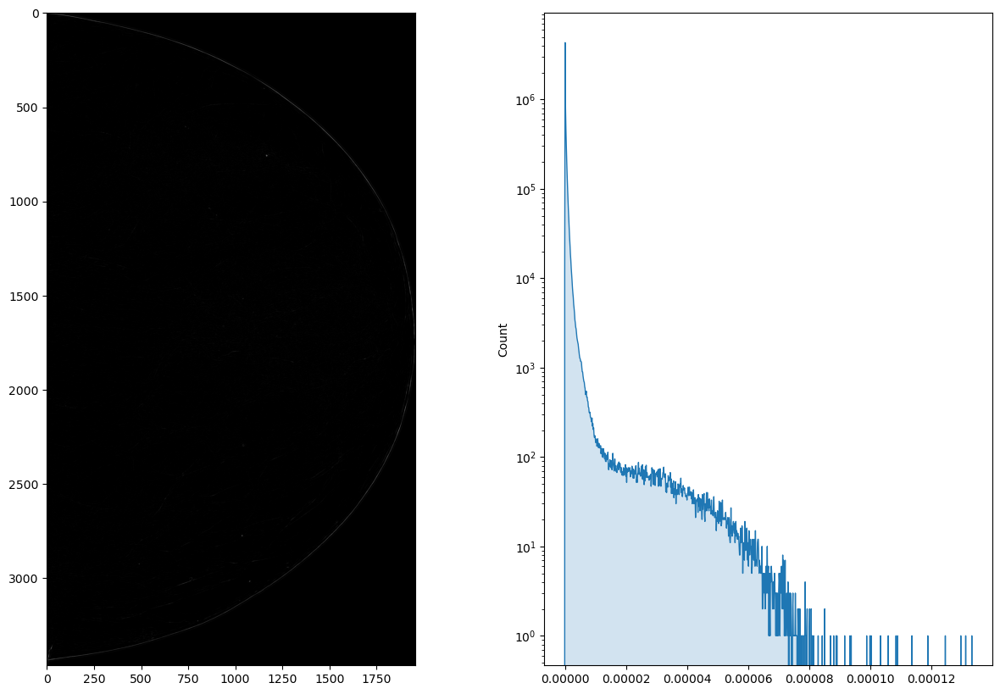

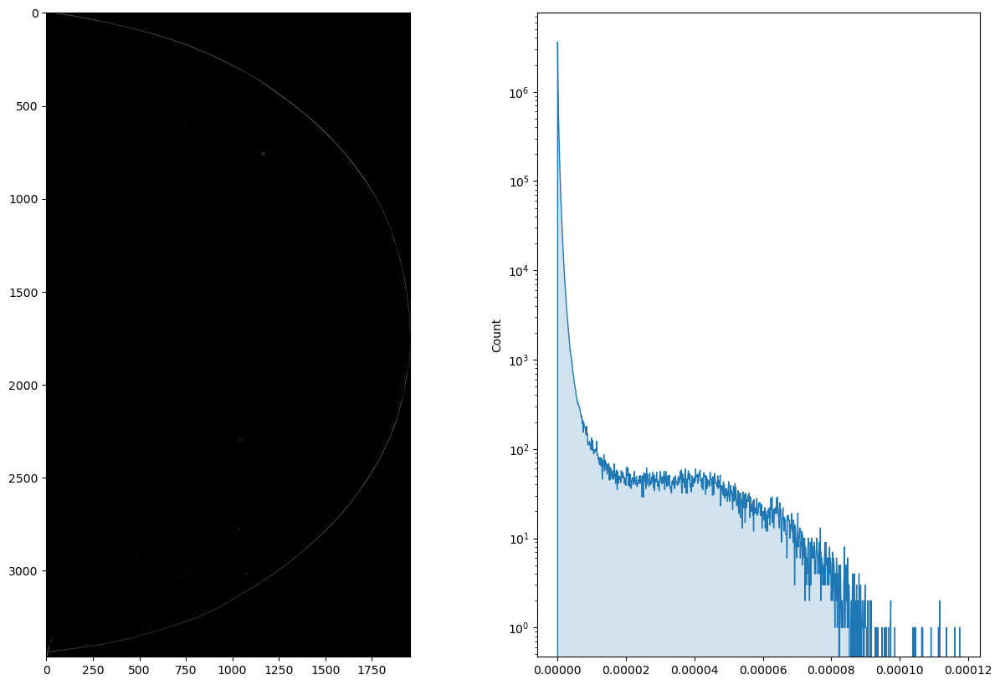

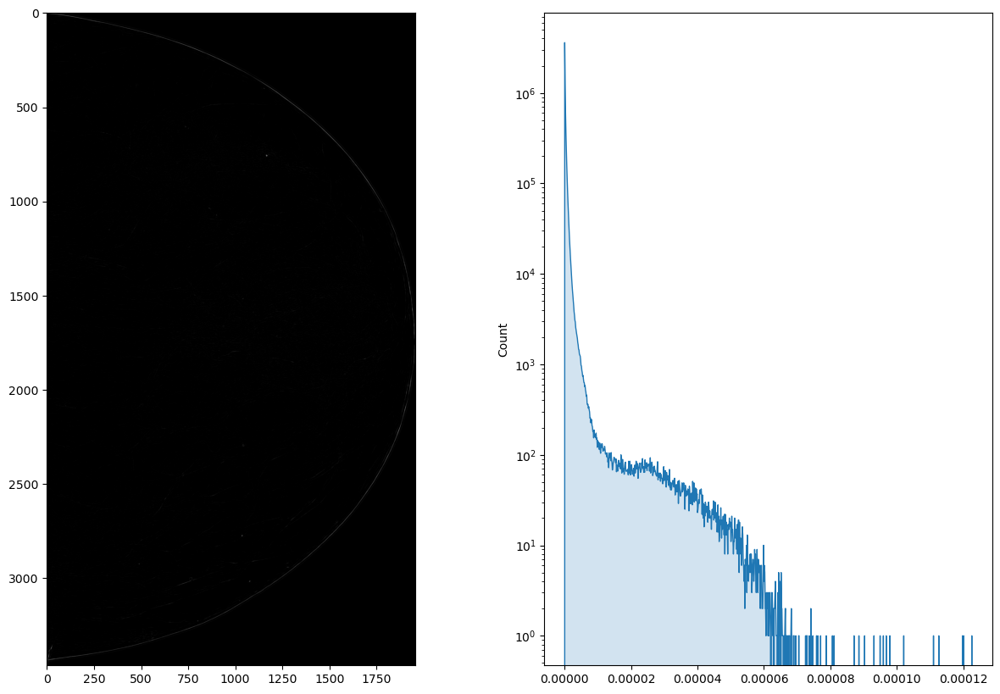

In [25]:
for i in range(int(ms_eigs.shape[0]/2)):
    plot_img_hist(ms_eigs[i][0],ms_eigs[i][0])
    plot_img_hist(ms_eigs[i][1],ms_eigs[i][1])

In [30]:
np.shape(blob_list_arr)

(1725, 3)

In [41]:
# Create binary mask

img_binary_blobs = np.zeros(image.shape)

for blob in blobs_filtered:
    img_binary_blobs = cv2.circle(img_binary_blobs,(blob[1],blob[0]),int(blob[2]*sqrt(2)),255,-1)

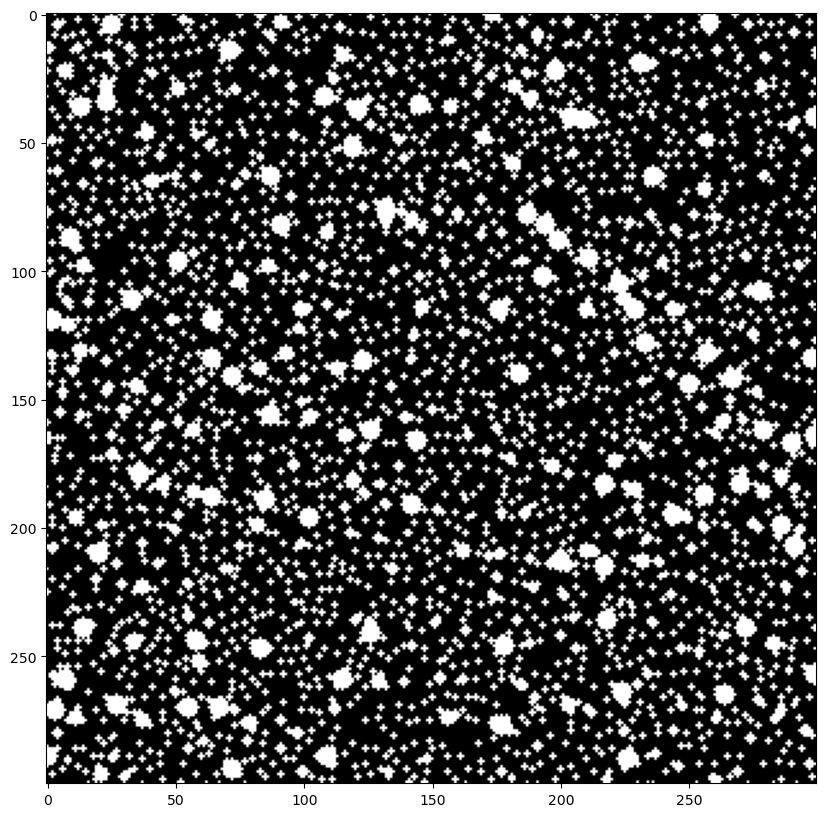

In [43]:
f,ax = plt.subplots(figsize=(10,10))
plt.imshow(img_binary_blobs[200:500,200:500],cmap='gray') # [200:500,200:500]

100%|██████████| 92016/92016 [00:28<00:00, 3255.17it/s]


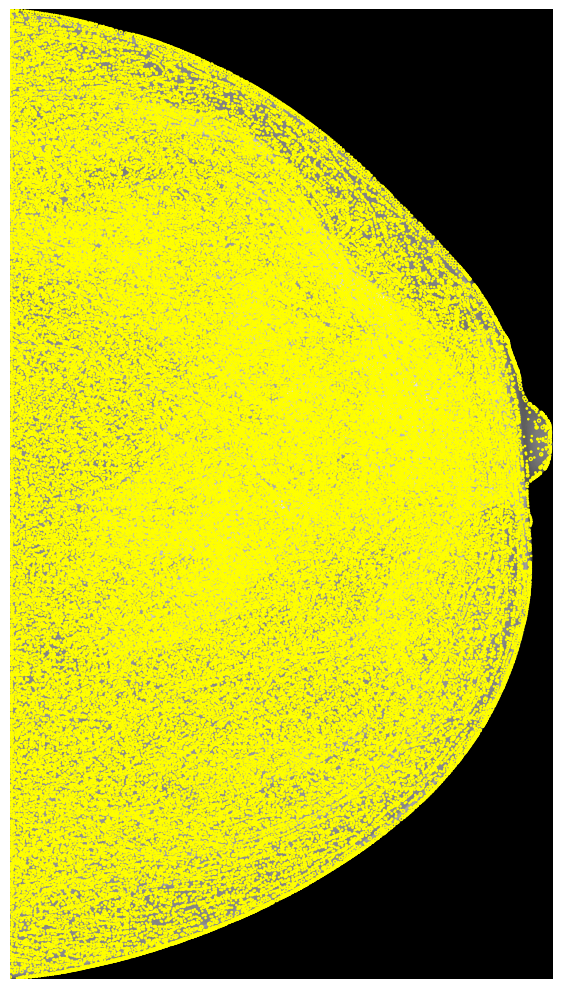

In [37]:
# blobs_filtered_copy = np.asarray(blobs_filtered.copy())
# blobs_filtered_copy[:,2] = blobs_filtered_copy[:,2] * sqrt(2)
# plot_blobs(image,blobs_filtered_copy)

#### Testing DOH (det of hessians)

In [44]:

from skimage.feature import blob_doh

min_sigma = 1.18
max_sigma = 3.1
sigma_ratio = 1.05 # must be the same as k
t_dog = 0.006
overlap_dog = 1

blobs_doh = blob_doh(image,min_sigma=min_sigma,max_sigma=max_sigma,num_sigma=n_scales,threshold=t_dog,overlap=overlap_dog)
print(blobs_doh.shape)


img_doh_blobs = np.zeros(image.shape)
#blobs_doh_list = [[blob[0].astype(int),blob[1].astype(int),blob[2]] for blob in blob_doh]

for blob in (blobs_doh).astype(int):
    img_doh_blobs = cv2.circle(img_doh_blobs,(blob[1],blob[0]),int(blob[2]*sqrt(2)),255,-1)

(20664, 3)


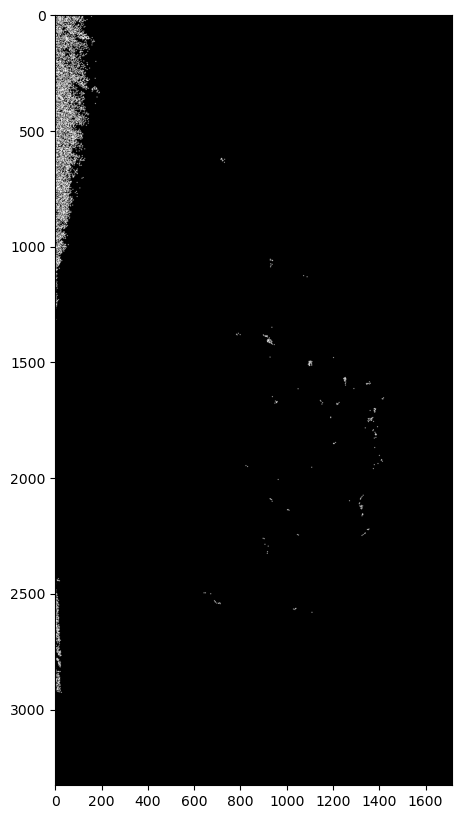

In [45]:
f,ax = plt.subplots(figsize=(10,10))
plt.imshow(img_doh_blobs,cmap='gray')

#### Get h_thr

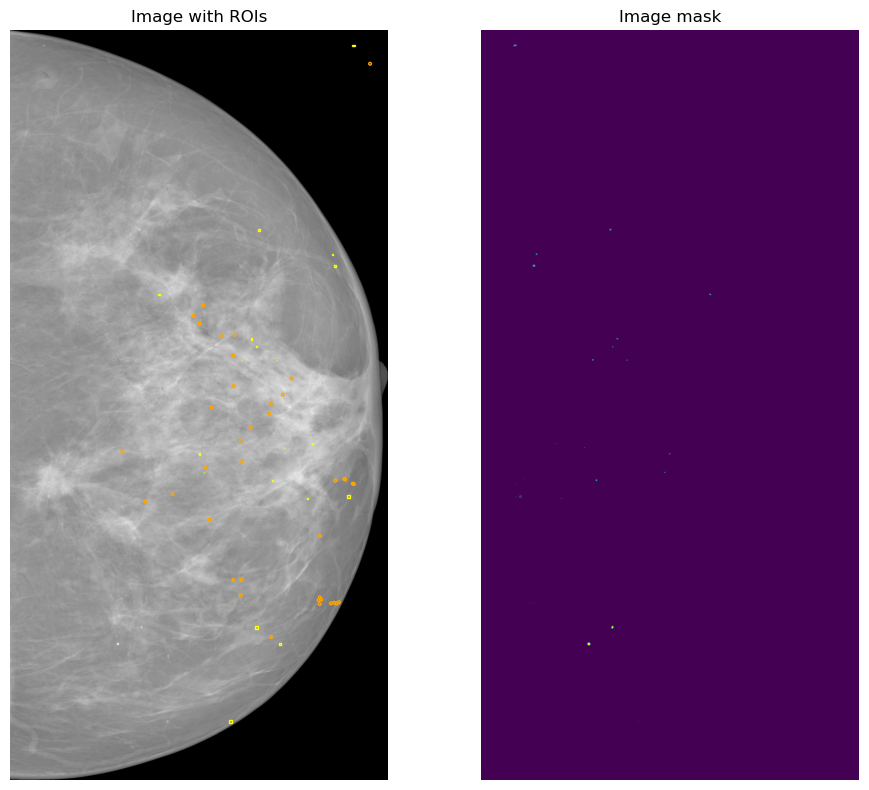

In [104]:
img_idx = 1
plot_img_rois(img_idx)

In [105]:
k = 1.05
n_scales = 20
sf = 1/(k-1)
min_sigma = 1.18

image = norm_image(db[img_idx]['img']) #*(2**8)).astype(np.uint8)

sigma_array = np.array([min_sigma*(k**n) for n in range(n_scales+1)]) # np.flip
print(f'Sigma array: {sigma_array}')

gaussian_images = [gaussian_filter(image, s, mode='reflect') for s in sigma_array]

img_dog = [sf*(gaussian_images[i] - gaussian_images[i+1]) for i in range(n_scales)]
img_dog = np.asarray(img_dog)
print(f'Scale-space DoG shape: {img_dog.shape}')

Sigma array: [1.18       1.239      1.30095    1.3659975  1.43429738 1.50601224
 1.58131286 1.6603785  1.74339742 1.83056729 1.92209566 2.01820044
 2.11911046 2.22506599 2.33631929 2.45313525 2.57579201 2.70458162
 2.8398107  2.98180123 3.13089129]
Scale-space DoG shape: (20, 3330, 1677)


In [106]:
# hessian matrix of dog scale-space with condition mask
h_thr = 1.4
img_hdog_filter = []
condition_list = []

print('Gettin hessian...')
for sigma_idx,dog in enumerate(tqdm(img_dog)):
    hrr,hrc,hcc = hessian_matrix(dog,sigma=sigma_array[sigma_idx],mode='constant') #
    trace = hrr + hcc
    #print(f'trace min: {trace.min()}, max: {trace.max()}')    
    det = (hrr*hcc) - hrc**2 #hessian_matrix_det(dog)
    #print(f'det min: {det.min()}, max: {det.max()}')
    condition = np.abs(det)/(trace**2)
    #print(f'condition max: {condition.max()}')
    #hessian_mask = ((trace < 0) & ((det < 0) | (np.abs(det)/(trace**2) <= h_thr)))
    hessian_mask = (trace < 0 & ((det < 0) | (np.abs(det)/(trace**2) <= h_thr)))
    # det_list.append(det)
    condition_list.append(condition)
    img_hdog_filter.append(hessian_mask)
    #break
img_hdog_filter = np.asarray(img_hdog_filter)
condition_list = np.asarray(condition_list)

Gettin hessian...


  0%|          | 0/20 [00:00<?, ?it/s]/tmp/ipykernel_3180/3315616428.py:13: RuntimeWarning: divide by zero encountered in true_divide
  condition = np.abs(det)/(trace**2)
/tmp/ipykernel_3180/3315616428.py:13: RuntimeWarning: invalid value encountered in true_divide
  condition = np.abs(det)/(trace**2)
/tmp/ipykernel_3180/3315616428.py:16: RuntimeWarning: divide by zero encountered in true_divide
  hessian_mask = (trace < 0 & ((det < 0) | (np.abs(det)/(trace**2) <= h_thr)))
/tmp/ipykernel_3180/3315616428.py:16: RuntimeWarning: invalid value encountered in true_divide
  hessian_mask = (trace < 0 & ((det < 0) | (np.abs(det)/(trace**2) <= h_thr)))
100%|██████████| 20/20 [00:11<00:00,  1.70it/s]


In [107]:
condition_list.shape

(20, 3330, 1677)

In [70]:
db[img_idx].keys()

dict_keys(['idx', 'lab', 'img', 'lesion_bboxes', 'lesion_mask', 'side'])

In [71]:
# Get bounding boxes mask
lesion_bboxes = db[img_idx]['lesion_bboxes']
lesion_bboxes_mask = np.zeros(condition_list.shape[1:], dtype=bool)
for lesion in lesion_bboxes:
    if lesion[0] == lesion[1]:
        lesion_bboxes_mask[lesion[0][1],lesion[0][0]] = True
    else:
        row1 = lesion[0][1]
        row2 = lesion[1][1]
        col1 = lesion[0][0]
        col2 = lesion[1][0]
        lesion_bboxes_mask[row1:row2,col1:col2] = True

In [110]:
# Correct mask
lesion_bboxes_mask = db[img_idx]['lesion_mask'] != 0

In [111]:
lesion_bboxes_mask.sum()

1015

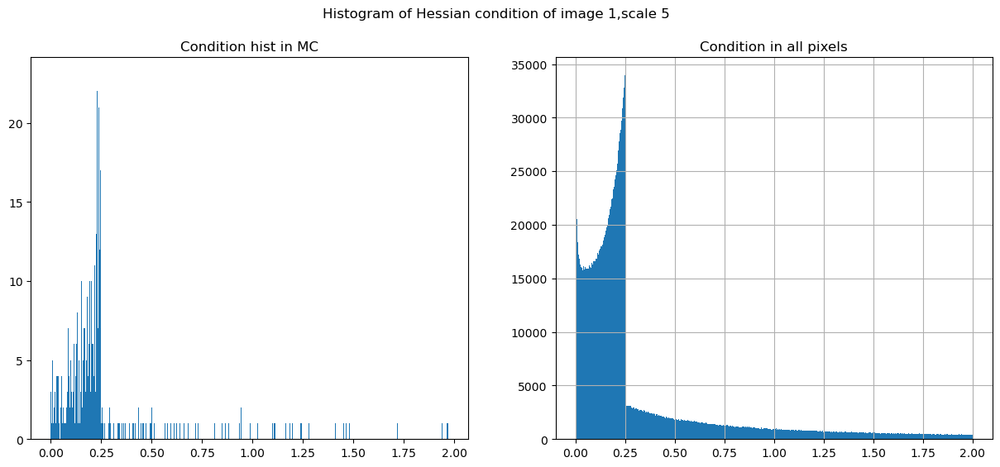

In [114]:
scale = 5
con_fil = condition_list[scale][lesion_bboxes_mask]
con_x = condition_list[scale]
fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].hist(con_fil[~np.isnan(con_fil) & (~np.isinf(con_fil)) & (con_fil > 0) & (con_fil < 2)],bins=1000)
ax[0].set_title('Condition hist in MC')
ax[1].hist(con_x[~np.isnan(con_x) & (~np.isinf(con_x)) & (con_x > 0) & (con_x < 2)],bins=1000)
ax[1].set_title('Condition in all pixels')
plt.suptitle(f'Histogram of Hessian condition of image {img_idx},scale {scale}')
plt.grid('on')
plt.show()